In [1]:
# stanford dog breed dataset download
!wget http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar

--2021-09-11 05:21:32--  http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 793579520 (757M) [application/x-tar]
Saving to: ‘images.tar’

images.tar          100%[===================>] 756.82M  14.6MB/s    in 43s     

2021-09-11 05:22:16 (17.6 MB/s) - ‘images.tar’ saved [793579520/793579520]



In [2]:
!ls; tar -xvf images.tar

__notebook_source__.ipynb  images.tar
Images/
Images/n02085620-Chihuahua/
Images/n02085620-Chihuahua/n02085620_10621.jpg
Images/n02085620-Chihuahua/n02085620_10976.jpg
Images/n02085620-Chihuahua/n02085620_11238.jpg
Images/n02085620-Chihuahua/n02085620_11258.jpg
Images/n02085620-Chihuahua/n02085620_11337.jpg
Images/n02085620-Chihuahua/n02085620_1152.jpg
Images/n02085620-Chihuahua/n02085620_11696.jpg
Images/n02085620-Chihuahua/n02085620_11818.jpg
Images/n02085620-Chihuahua/n02085620_11948.jpg
Images/n02085620-Chihuahua/n02085620_1205.jpg
Images/n02085620-Chihuahua/n02085620_12334.jpg
Images/n02085620-Chihuahua/n02085620_1235.jpg
Images/n02085620-Chihuahua/n02085620_1298.jpg
Images/n02085620-Chihuahua/n02085620_13151.jpg
Images/n02085620-Chihuahua/n02085620_1321.jpg
Images/n02085620-Chihuahua/n02085620_13383.jpg
Images/n02085620-Chihuahua/n02085620_1346.jpg
Images/n02085620-Chihuahua/n02085620_14413.jpg
Images/n02085620-Chihuahua/n02085620_14516.jpg
Images/n02085620-Chihuahua/n02085620_14

In [3]:
!ls; pwd

Images	__notebook_source__.ipynb  images.tar
/kaggle/working


In [4]:
!cd /kaggle/working/Images; ls

n02085620-Chihuahua			  n02100583-vizsla
n02085782-Japanese_spaniel		  n02100735-English_setter
n02085936-Maltese_dog			  n02100877-Irish_setter
n02086079-Pekinese			  n02101006-Gordon_setter
n02086240-Shih-Tzu			  n02101388-Brittany_spaniel
n02086646-Blenheim_spaniel		  n02101556-clumber
n02086910-papillon			  n02102040-English_springer
n02087046-toy_terrier			  n02102177-Welsh_springer_spaniel
n02087394-Rhodesian_ridgeback		  n02102318-cocker_spaniel
n02088094-Afghan_hound			  n02102480-Sussex_spaniel
n02088238-basset			  n02102973-Irish_water_spaniel
n02088364-beagle			  n02104029-kuvasz
n02088466-bloodhound			  n02104365-schipperke
n02088632-bluetick			  n02105056-groenendael
n02089078-black-and-tan_coonhound	  n02105162-malinois
n02089867-Walker_hound			  n02105251-briard
n02089973-English_foxhound		  n02105412-kelpie
n02090379-redbone			  n02105505-komondor
n02090622-borzoi			  n02105641-Old_English_sheepdog
n02090721-Irish_wolfhound		  n02105855-Shetland_sheepdog
n02091032-Itali

In [5]:
import numpy as np
import pandas as pd
import os

for dirname, _, filenames in os.walk('/kaggle/working/Images'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/working/Images/n02108915-French_bulldog/n02108915_341.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_12317.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_5367.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_3300.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_4901.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_10204.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_12460.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_6521.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_1513.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_2570.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_553.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_328.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_3557.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_2545.jpg
/kaggle/working/Images/n02108915-French_bulldog/n02108915_1228

### DataFrame Create

In [6]:
start_position = '/kaggle/working/Images/n02109961-Eskimo_dog/n02109961_12338.jpg'.find('/', 20)
print(start_position)

end_position = '/kaggle/working/Images/n02109961-Eskimo_dog/n02109961_12338.jpg'.rfind('/')
print(end_position)

imsi_breed = '/kaggle/working/Images/n02109961-Eskimo_dog/n02109961_12338.jpg'[start_position+1:end_position]
print(imsi_breed)

label = imsi_breed[imsi_breed.find('-')+1:]
print(label)

22
43
n02109961-Eskimo_dog
Eskimo_dog


In [7]:
IMAGE_DIR = '/kaggle/working/Images'

def make_dogbreed_dataframe(image_dir=IMAGE_DIR):
    paths = []
    label_gubuns = []
    for dirname, _, filenames in os.walk(image_dir):
        for filename in filenames:
            if '.jpg' in filename:
                file_path = dirname + '/' +filename
                paths.append(file_path)
                
                start_position = file_path.find('/', 20)
                end_position = file_path.rfind('/')
                label = file_path[start_position+1:end_position]
                breed = label[label.find('-')+1:]
                label_gubuns.append(breed)
    
    data_df = pd.DataFrame({
        'path': paths,
        'label': label_gubuns
    })
    
    return data_df

In [8]:
pd.set_option('display.max_colwidth', 200)
data_df = make_dogbreed_dataframe()

print('data_df shape: ', data_df.shape)
data_df.head()

data_df shape:  (20580, 2)


,path,label
0,/kaggle/working/Images/n02108915-French_bulldog/n02108915_341.jpg,French_bulldog
1,/kaggle/working/Images/n02108915-French_bulldog/n02108915_12317.jpg,French_bulldog
2,/kaggle/working/Images/n02108915-French_bulldog/n02108915_5367.jpg,French_bulldog
3,/kaggle/working/Images/n02108915-French_bulldog/n02108915_3300.jpg,French_bulldog
4,/kaggle/working/Images/n02108915-French_bulldog/n02108915_4901.jpg,French_bulldog


### Dog Breed Individual Distribution

In [9]:
data_df['label'].value_counts()

Maltese_dog            252
Afghan_hound           239
Scottish_deerhound     232
Pomeranian             219
Samoyed                218
                      ... 
Irish_water_spaniel    150
dhole                  150
Eskimo_dog             150
Pekinese               149
redbone                148
Name: label, Length: 120, dtype: int64

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119]),
 [Text(0, 0, 'French_bulldog'),
  Text(1, 0, 'basenji'),
  Text(2, 0, 'dingo'),
  Text(3, 0, 'Labrador_retriever'),
  Text(4, 0, 'Greater_Swiss_Mountain_dog'),
  Text(5, 0, 'Chihuahua'),
  Text(6, 0, 'wire-haired_fox_terrier'),
  Text(7, 0, 'Ibizan_hound'),
  Text(8, 0, 'groenendael'),
  Text(9, 0, 'African_hunting_d

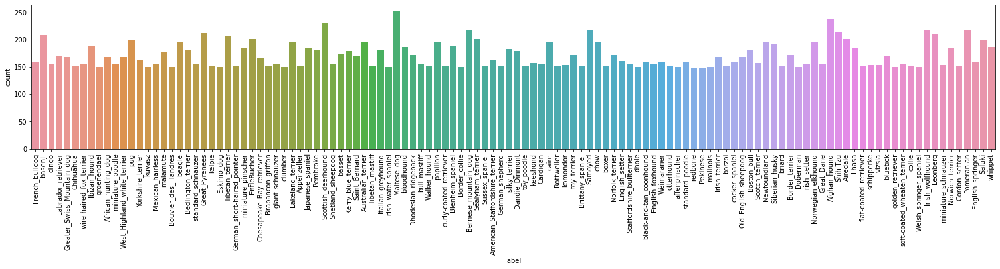

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(26, 4))

sns.countplot(data=data_df, x='label')
plt.xticks(rotation=90)

### Dog Breed Dataset image

In [15]:
import cv2

def show_grid_images(image_path_list, ncols=8, title=None):
    figure, axs = plt.subplots(figsize=(22, 4), nrows=1, ncols=ncols)
    for i in range(ncols):
        image = cv2.cvtColor(cv2.imread(image_path_list[i]), cv2.COLOR_BGR2RGB)
        axs[i].imshow(image)
        axs[i].set_title(title)

In [16]:
breed_image_list_01 = data_df[data_df['label']=='Staffordshire_bullterrier']['path'].iloc[:6].tolist()
breed_image_list_02 = data_df[data_df['label']=='American_Staffordshire_terrier']['path'].iloc[:6].tolist()

print(breed_image_list_01)
print(breed_image_list_02)

['/kaggle/working/Images/n02093256-Staffordshire_bullterrier/n02093256_6077.jpg', '/kaggle/working/Images/n02093256-Staffordshire_bullterrier/n02093256_3306.jpg', '/kaggle/working/Images/n02093256-Staffordshire_bullterrier/n02093256_5791.jpg', '/kaggle/working/Images/n02093256-Staffordshire_bullterrier/n02093256_1826.jpg', '/kaggle/working/Images/n02093256-Staffordshire_bullterrier/n02093256_5325.jpg', '/kaggle/working/Images/n02093256-Staffordshire_bullterrier/n02093256_4997.jpg']
['/kaggle/working/Images/n02093428-American_Staffordshire_terrier/n02093428_5165.jpg', '/kaggle/working/Images/n02093428-American_Staffordshire_terrier/n02093428_10929.jpg', '/kaggle/working/Images/n02093428-American_Staffordshire_terrier/n02093428_3331.jpg', '/kaggle/working/Images/n02093428-American_Staffordshire_terrier/n02093428_9929.jpg', '/kaggle/working/Images/n02093428-American_Staffordshire_terrier/n02093428_592.jpg', '/kaggle/working/Images/n02093428-American_Staffordshire_terrier/n02093428_9513.jp

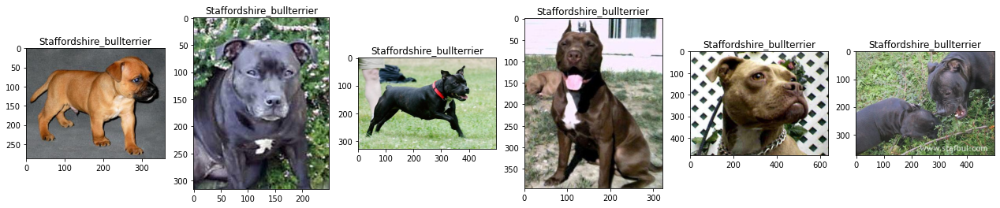

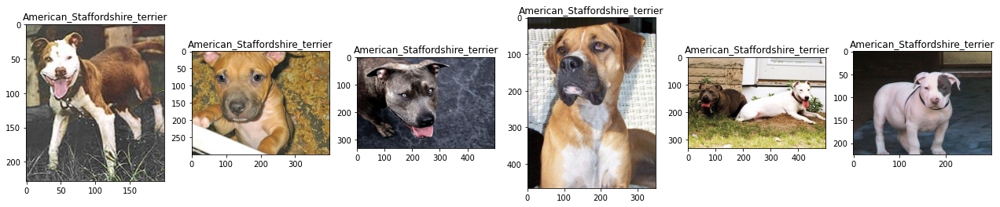

In [17]:
show_grid_images(breed_image_list_01, ncols=6, title='Staffordshire_bullterrier')
show_grid_images(breed_image_list_02, ncols=6, title='American_Staffordshire_terrier')

In [18]:
data_df['label'].value_counts().index.tolist()

['Maltese_dog',
 'Afghan_hound',
 'Scottish_deerhound',
 'Pomeranian',
 'Samoyed',
 'Irish_wolfhound',
 'Bernese_mountain_dog',
 'Shih-Tzu',
 'Great_Pyrenees',
 'Leonberg',
 'basenji',
 'Tibetan_terrier',
 'Airedale',
 'EntleBucher',
 'Sealyham_terrier',
 'pug',
 'Saluki',
 'Lakeland_terrier',
 'cairn',
 'Australian_terrier',
 'chow',
 'Norwegian_elkhound',
 'papillon',
 'Newfoundland',
 'beagle',
 'Siberian_husky',
 'Blenheim_spaniel',
 'Ibizan_hound',
 'whippet',
 'bloodhound',
 'Lhasa',
 'Japanese_spaniel',
 'Norwich_terrier',
 'miniature_pinscher',
 'silky_terrier',
 'Bedlington_terrier',
 'Boston_bull',
 'Italian_greyhound',
 'Pembroke',
 'Dandie_Dinmont',
 'Kerry_blue_terrier',
 'malamute',
 'basset',
 'toy_terrier',
 'Norfolk_terrier',
 'Rhodesian_ridgeback',
 'Border_terrier',
 'bluetick',
 'Labrador_retriever',
 'Saint_Bernard',
 'Old_English_sheepdog',
 'West_Highland_white_terrier',
 'African_hunting_dog',
 'Irish_terrier',
 'Greater_Swiss_Mountain_dog',
 'Chesapeake_Bay_ret

In [19]:
breed_list = data_df['label'].value_counts().index.tolist()

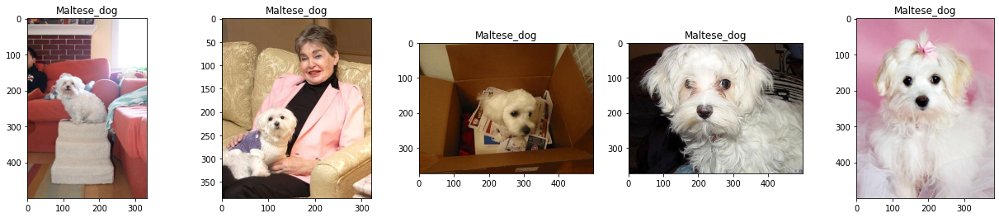

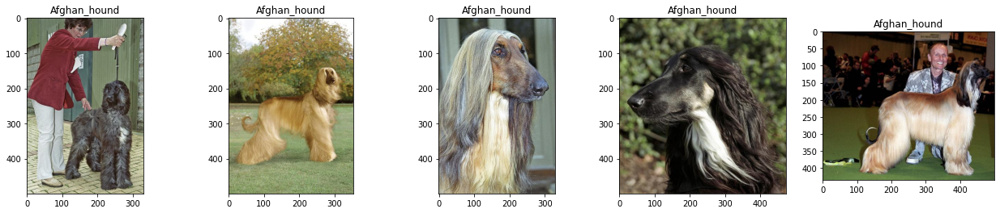

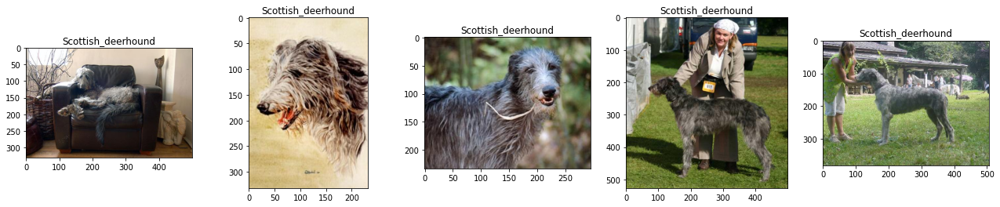

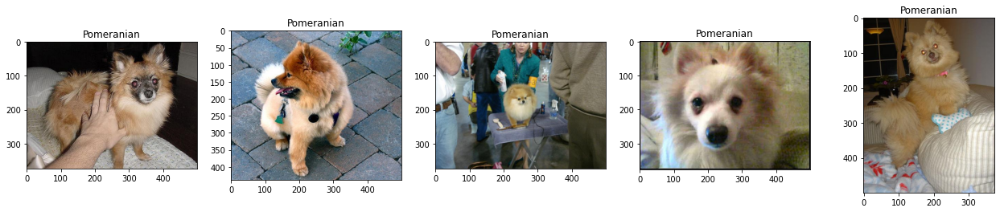

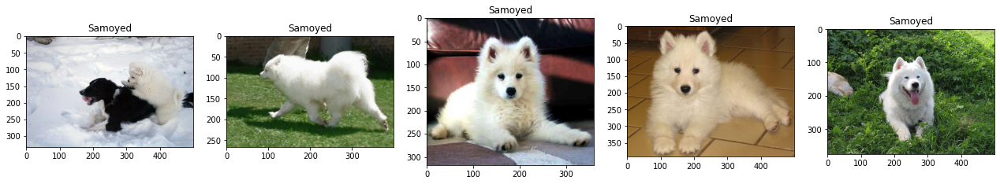

...

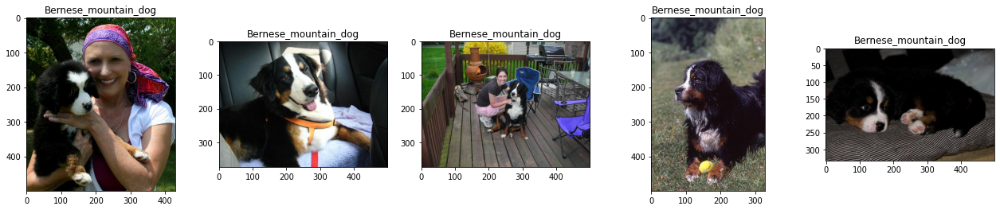

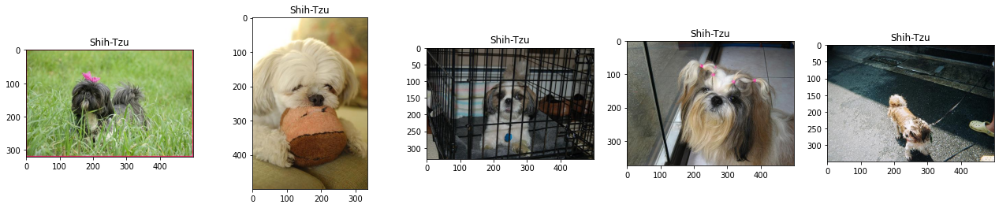

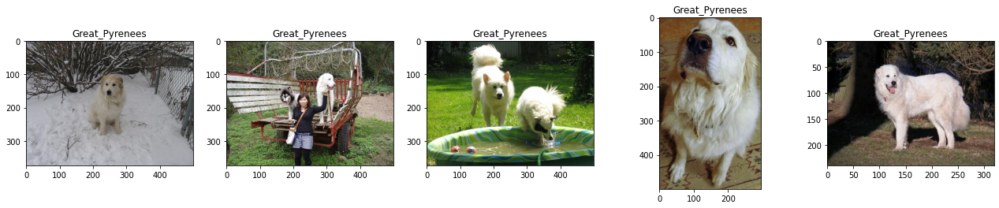

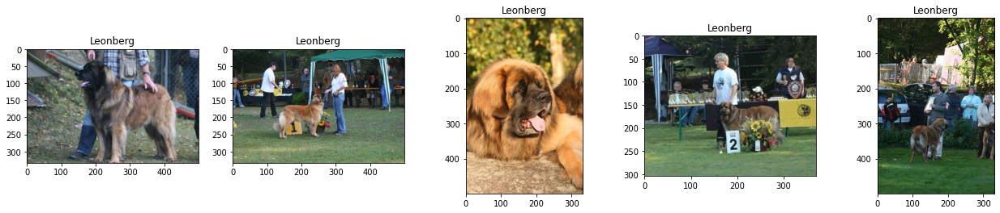

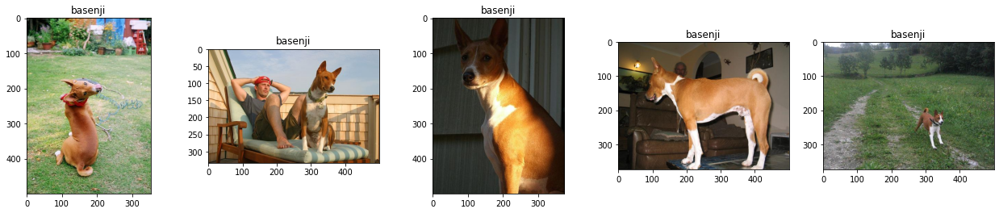

In [20]:
for iter_cnt, breed in enumerate(breed_list):
    breed_image_list = data_df[data_df['label']==breed]['path'].iloc[:6].tolist()
    show_grid_images(breed_image_list, ncols=5, title=breed)
    if iter_cnt == 10:
        break

### Resize 224 x 224

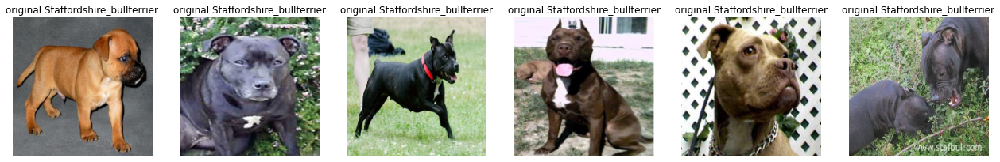

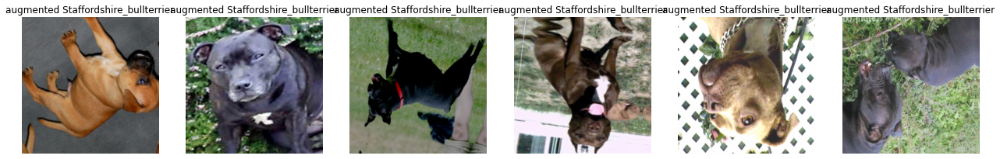

In [21]:
import albumentations as A

imsi_augmentor = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ShiftScaleRotate(p=0.5),
#     A.CenterCrop(height=200, width=200, p=0.5),
    A.RandomBrightnessContrast(brightness_limit=(-0.2, 0.2), contrast_limit=(-0.2, 0.2), p=0.5),
    A.HueSaturationValue(hue_shift_limit=0.2, sat_shift_limit=0.2, val_shift_limit=0.2, p=0.5)
])

def show_grid_images(image_path_list, augmentor=None, ncols=4, title=None):
    figure, axs = plt.subplots(figsize=(22, 4), nrows=1, ncols=ncols)
    for i in range(ncols):
        image = cv2.cvtColor(cv2.imread(image_path_list[i]), cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (224, 224))
        if augmentor is not None:
            image = augmentor(image=image)['image']
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(title)

breed_image_list_01 = data_df[data_df['label']=='Staffordshire_bullterrier']['path'].iloc[:6].tolist()

show_grid_images(breed_image_list_01, augmentor=None, ncols=6, title='original Staffordshire_bullterrier')
show_grid_images(breed_image_list_01, augmentor=imsi_augmentor, ncols=6, title='augmented Staffordshire_bullterrier')


### Entire Dataframe -> Train/Test Dataframe split

In [22]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(data_df, test_size=0.4, stratify=data_df['label'], random_state=2021)

print("Train dataframe shape: ", train_df.shape)
print("Test dataframe shape: ", test_df.shape)

Train dataframe shape:  (12348, 2)
Test dataframe shape:  (8232, 2)


In [23]:
print(train_df['label'].value_counts()/train_df.shape[0])
print(test_df['label'].value_counts()/test_df.shape[0])

Maltese_dog             0.012229
Afghan_hound            0.011662
Scottish_deerhound      0.011257
Samoyed                 0.010609
Bernese_mountain_dog    0.010609
                          ...   
malinois                0.007289
affenpinscher           0.007289
groenendael             0.007289
redbone                 0.007208
Pekinese                0.007208
Name: label, Length: 120, dtype: float64
Maltese_dog               0.012269
Afghan_hound              0.011540
Scottish_deerhound        0.011297
Pomeranian                0.010690
Bernese_mountain_dog      0.010569
                            ...   
Eskimo_dog                0.007289
curly-coated_retriever    0.007289
malinois                  0.007289
Irish_water_spaniel       0.007289
redbone                   0.007167
Name: label, Length: 120, dtype: float64


### Train Dataframe -> Train/Validation Dataframe split

In [24]:
from sklearn.model_selection import train_test_split

# Dataframe -> Numpy array transformation
train_path = train_df['path'].values

# Label One Hot Encoding
train_label = pd.get_dummies(train_df['label']).values

# Train/Validation Dataframe split
tr_path, val_path, tr_label, val_label = train_test_split(train_path, train_label, stratify=train_label, test_size=0.2, random_state=0)

print("Train path shape: ", tr_path.shape)
print("Train label shape: ", tr_label.shape)
print("Validation path shape: ", val_path.shape)
print("Validation label shape: ", val_label.shape)

Train path shape:  (9878,)
Train label shape:  (9878, 120)
Validation path shape:  (2470,)
Validation label shape:  (2470, 120)


### Sequence Dataset Create

In [27]:
from tensorflow.keras.utils import Sequence
import sklearn
import cv2

BATCH_SIZE = 64
IMAGE_SIZE = 224

# Input parameters image_filenames, labels: numpy array

class Breed_Dataset(Sequence):
    
    def __init__(self, image_filenames, labels, 
                 image_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
                 augmentor=None, shuffle=False, pre_func=None
                ):
        '''
        Input parameters Explanation
        image_filenames: image file absolute paths using opencv
        labels: label for corresponding each image
        batch_size: batch nums as calling __getitem(self, index) function
        augmentor: albumentations object
        shuffle
        '''
        
        self.image_filenames = image_filenames
        self.labels = labels
        self.image_size = image_size
        self.batch_size = batch_size
        self.augmentor = augmentor
        self.pre_func = pre_func
        
        self.shuffle = shuffle
        
        if self.shuffle:
            # self.on_epoch_end()
            pass
        
    def __len__(self):
        return int(np.ceil(len(self.labels) / self.batch_size))
    
    def __getitem__(self, index):
        
        image_name_batch = self.image_filenames[index*self.batch_size:(index+1)*self.batch_size]
        if self.labels is not None:
            label_batch = self.labels[index*self.batch_size:(index+1)*self.batch_size]
            
        image_batch = np.zeros((image_name_batch.shape[0], self.image_size, self.image_size, 3), dtype='float32')
        
        for image_index in range(image_name_batch.shape[0]):
            image = cv2.cvtColor(cv2.imread(image_name_batch[image_index]), cv2.COLOR_BGR2RGB)
            if self.augmentor is not None:
                image = self.augmentor(image=image)['image']
            image = cv2.resize(image, (self.image_size, self.image_size))
            if self.pre_func is not None:
                image = self.pre_func(image)
            
            image_batch[image_index] = image
            
        return image_batch, label_batch
    
    def on_epoch_end(self):
        if (self.shuffle):
            self.image_filenames, self.labels = sklearn.utils.shuffle(self.image_filenames, self.labels)
        else:
            pass

### Augmentation for Horizontal Flip

In [29]:
import albumentations as A

augmentor_light = A.Compose([
    A.HorizontalFlip(p=0.5),
])

### Train/Valiation Breed_Dataset Create

In [30]:
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess_input
from tensorflow.keras.applications.xception import preprocess_input as xception_preprocess_input

tr_ds = Breed_Dataset(
    tr_path,
    tr_label,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    augmentor=augmentor_light,
    shuffle=True,
    pre_func=xception_preprocess_input
)

val_ds = Breed_Dataset(
    val_path,
    val_label,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    augmentor=None,
    shuffle=False,
    pre_func=xception_preprocess_input
)

tr_image_batch = next(iter(tr_ds))[0]
val_image_batch = next(iter(val_ds))[0]

print("Train Sequence Dataset Batch Size: ", tr_image_batch.shape)
print("Validation Sequence Dataset Batch Size: ", val_image_batch.shape)

Train Sequence Dataset Batch Size:  (64, 224, 224, 3)
Validation Sequence Dataset Batch Size:  (64, 224, 224, 3)


In [34]:
import time

tr_ds = Breed_Dataset(
    tr_path,
    tr_label,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    augmentor=augmentor_light,
    shuffle=True,
    pre_func=xception_preprocess_input
)

val_ds = Breed_Dataset(
    val_path,
    val_label,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    augmentor=None,
    shuffle=False,
    pre_func=xception_preprocess_input
)

start = time.time()

for value1, value2 in iter(tr_ds):
    print("image shape: ", value1.shape)
    print("label shape: ", value2.shape)
    end = time.time()
    print(end - start)
    print()
    start = end

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.2893202304840088

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.21537208557128906

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.22577452659606934

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.19353103637695312

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.19649195671081543

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.2024691104888916

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.2620706558227539

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.20778536796569824

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.2044670581817627

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.22048234939575195

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.20940542221069336

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.2479863166809082

image shape:  (64, 224, 224, 3)
label shape:  (64, 120)
0.23194551467895508

imag

### Pretrained Model Create
- resnet50
- xception
- efficientnetb0
- efficientnetb1

In [45]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.applications import Xception, ResNet50V2, EfficientNetB0, EfficientNetB1

def create_model(model_type='xception', in_shape=(224, 224, 3), n_classes=120):
    
    input_tensor = Input(shape=in_shape)
    
    if model_type == 'resnet50v2':
        base_model = ResNet50V2(include_top=False, weights='imagenet', input_tensor=input_tensor)
    elif model_type == 'xception':
        base_model = Xception(include_top=False, weights='imagenet', input_tensor=input_tensor)
    elif model_type == 'efficientnetb0':
        base_model = EfficientNetB0(include_top=False, weights='imagenet', input_tensor=input_tensor)
    elif model_type == 'efficientnetb1':
        base_model = EfficientNetB1(include_top=False, weights='imagenet', input_tensor=input_tensor)
    
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.5)(x)
    
    preds = Dense(units=n_classes, activation='softmax')(x)
    model = Model(inputs=input_tensor, outputs=preds)
    
    return model


### Summary
- Train/Validation Dataset Split
- Dataset Create
- Model Create
- Model Compile
- Callback
- Model Fit

In [46]:
import numpy as np
import pandas as pd
import os

from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import Sequence
import sklearn
import cv2

import albumentations as A

IMAGE_DIR = '/kaggle/working/Images'

In [47]:
def make_dogbreed_dataframe(image_dir=IMAGE_DIR):
    
    paths = []
    label_gubuns = []
    
    for dirname, _, filenames in os.walk(image_dir):
        for filename in filenames:
            if '.jpg' in filename:
                file_path = dirname + '/' + filename
                paths.append(file_path)
                start_position = file_path.find('/', 20)
                end_position = file_path.rfind('/')
                label = file_path[start_position+1:end_position]
                breed = label[label.find('-') + 1:]
                label_gubuns.append(breed)
    
    data_df = pd.DataFrame({
        'path': paths,
        'label': label_gubuns
    })
    
    return data_df

In [48]:
def get_train_valid(train_df, valid_size=0.2, random_state=2021):
    train_path = train_df['path'].values
    train_label = pd.get_dummies(train_df['label']).values
    
    tr_path, val_path, tr_label, val_label = train_test_split(train_path, train_label, test_size=valid_size, random_state=random_state)
    
    print('tr_path shape: ', tr_path.shape)
    print('tr_label shape: ', tr_label.shape)
    
    return tr_path, val_path, tr_label, val_label

In [49]:
BATCH_SIZE = 64
IMAGE_SIZE = 224

from tensorflow.keras.utils import Sequence
import sklearn
import cv2

BATCH_SIZE = 64
IMAGE_SIZE = 224

# Input parameters image_filenames, labels: numpy array

class Breed_Dataset(Sequence):
    
    def __init__(self, image_filenames, labels, 
                 image_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
                 augmentor=None, shuffle=False, pre_func=None
                ):
        '''
        Input parameters Explanation
        image_filenames: image file absolute paths using opencv
        labels: label for corresponding each image
        batch_size: batch nums as calling __getitem(self, index) function
        augmentor: albumentations object
        shuffle
        '''
        
        self.image_filenames = image_filenames
        self.labels = labels
        self.image_size = image_size
        self.batch_size = batch_size
        self.augmentor = augmentor
        self.pre_func = pre_func
        
        self.shuffle = shuffle
        
        if self.shuffle:
            # self.on_epoch_end()
            pass
        
    def __len__(self):
        return int(np.ceil(len(self.labels) / self.batch_size))
    
    def __getitem__(self, index):
        
        image_name_batch = self.image_filenames[index*self.batch_size:(index+1)*self.batch_size]
        if self.labels is not None:
            label_batch = self.labels[index*self.batch_size:(index+1)*self.batch_size]
            
        image_batch = np.zeros((image_name_batch.shape[0], self.image_size, self.image_size, 3), dtype='float32')
        
        for image_index in range(image_name_batch.shape[0]):
            image = cv2.cvtColor(cv2.imread(image_name_batch[image_index]), cv2.COLOR_BGR2RGB)
            if self.augmentor is not None:
                image = self.augmentor(image=image)['image']
            image = cv2.resize(image, (self.image_size, self.image_size))
            if self.pre_func is not None:
                image = self.pre_func(image)
            
            image_batch[image_index] = image
            
        return image_batch, label_batch
    
    def on_epoch_end(self):
        if (self.shuffle):
            self.image_filenames, self.labels = sklearn.utils.shuffle(self.image_filenames, self.labels)
        else:
            pass

In [50]:
augmentor_lignt = A.Compose([
    A.HorizontalFlip(p=0.5),
])

In [51]:
N_EPOCHS = 30

def train_model(model_type, train_df, initial_lr=0.001, augmentor=None, input_pre_func=None):
    
    tr_path, val_path, tr_label, val_label = get_train_valid(train_df, valid_size=0.2, random_state=2021)
    
    tr_ds = Breed_Dataset(
        tr_path,
        tr_label,
        image_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        augmentor=augmentor,
        shuffle=True,
        pre_func=input_pre_func
    )
    
    val_ds = Breed_Dataset(
        val_path,
        val_label,
        image_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        augmentor=None,
        shuffle=False,
        pre_func=input_pre_func
    )
    
    print("***** ", model_type, " Create and Train*****")
    
    model = create_model(model_type=model_type)
    model.compile(optimizer=Adam(lr=initial_lr), loss='categorical_crossentropy', metrics=['accuracy'])
    
    # Callbacks
    
    rlr_cb = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=3,
        mode='min',
        verbose=1
    )
    
    ely_cb = EarlyStopping(
        monitor='val_loss',
        patience=10,
        mode='min',
        verbose=1
    )
    
    history = model.fit(
        tr_ds,
        epochs=N_EPOCHS,
        steps_per_epoch=int(np.ceil(tr_path.shape[0]/BATCH_SIZE)),
        validation_data=val_ds,
        validation_steps=int(np.ceil(val_path.shape[0]/BATCH_SIZE)),
        callbacks=([rlr_cb, ely_cb]),
        verbose=1
    )
    
    return model, history

In [52]:
data_df = make_dogbreed_dataframe(image_dir=IMAGE_DIR)
train_df, test_df = train_test_split(data_df, test_size=0.4, stratify=data_df['label'], random_state=2021)

print(train_df.shape)
print(test_df.shape)

(12348, 2)
(8232, 2)


In [53]:
xception_model, xception_history = train_model(model_type='xception', train_df=train_df, initial_lr=0.0001, augmentor=augmentor_light, input_pre_func=xception_preprocess_input)

tr_path shape:  (9878,)
tr_label shape:  (9878, 120)
*****  xception  Create and Train*****
Epoch 1/30
155/155 [==============================] - 140s 828ms/step - loss: 3.8677 - accuracy: 0.2352 - val_loss: 0.8550 - val_accuracy: 0.7595
Epoch 2/30
155/155 [==============================] - 127s 815ms/step - loss: 0.8283 - accuracy: 0.7822 - val_loss: 0.7411 - val_accuracy: 0.7968
Epoch 3/30
155/155 [==============================] - 126s 814ms/step - loss: 0.4144 - accuracy: 0.8863 - val_loss: 0.7071 - val_accuracy: 0.7984
Epoch 4/30
155/155 [==============================] - 126s 814ms/step - loss: 0.2354 - accuracy: 0.9379 - val_loss: 0.6754 - val_accuracy: 0.8045
Epoch 5/30
155/155 [==============================] - 126s 813ms/step - loss: 0.1324 - accuracy: 0.9682 - val_loss: 0.6998 - val_accuracy: 0.7980
Epoch 6/30
155/155 [==============================] - 126s 813ms/step - loss: 0.0923 - accuracy: 0.9764 - val_loss: 0.7338 - val_accuracy: 0.7915
Epoch 7/30
155/155 [============

### Test Dataset
- Evaluation
- Prediction

In [54]:
test_path = test_df['path'].values
test_label = pd.get_dummies(test_df['label']).values

test_df['gt_class'] = np.argmax(test_label, axis=1)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [62]:
print("Test Dataset shape: ", test_df.shape)
test_df.head()

Test Dataset shape:  (8232, 4)


,path,label,gt_class,xception_prediction_class
4349,/kaggle/working/Images/n02100236-German_short-haired_pointer/n02100236_3460.jpg,German_short-haired_pointer,27,27
12430,/kaggle/working/Images/n02108089-boxer/n02108089_995.jpg,boxer,82,82
4042,/kaggle/working/Images/n02109961-Eskimo_dog/n02109961_3217.jpg,Eskimo_dog,24,24
3984,/kaggle/working/Images/n02109961-Eskimo_dog/n02109961_5066.jpg,Eskimo_dog,24,24
10485,/kaggle/working/Images/n02096437-Dandie_Dinmont/n02096437_3847.jpg,Dandie_Dinmont,18,18


In [56]:
test_ds = Breed_Dataset(test_path, test_label, image_size=IMAGE_SIZE, batch_size=BATCH_SIZE,
                        augmentor=None, shuffle=False, pre_func=xception_preprocess_input)

xception_model.evaluate(test_ds)

129/129 [==============================] - 39s 298ms/step - loss: 0.6741 - accuracy: 0.8241


[0.6740849018096924, 0.8241010904312134]

### Check Prediction
- Ground Truth Breed Labels
- Prediction Breed Labels

In [58]:
predict_result = xception_model.predict(test_ds, steps=int(np.ceil(len(test_label)/BATCH_SIZE)))
predict_class = np.argmax(predict_result, axis=1)

test_df['xception_prediction_class'] = predict_class

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [59]:
test_df.head()

,path,label,gt_class,xception_prediction_class
4349,/kaggle/working/Images/n02100236-German_short-haired_pointer/n02100236_3460.jpg,German_short-haired_pointer,27,27
12430,/kaggle/working/Images/n02108089-boxer/n02108089_995.jpg,boxer,82,82
4042,/kaggle/working/Images/n02109961-Eskimo_dog/n02109961_3217.jpg,Eskimo_dog,24,24
3984,/kaggle/working/Images/n02109961-Eskimo_dog/n02109961_5066.jpg,Eskimo_dog,24,24
10485,/kaggle/working/Images/n02096437-Dandie_Dinmont/n02096437_3847.jpg,Dandie_Dinmont,18,18


In [60]:
test_df[test_df['gt_class'] != test_df['xception_prediction_class']]

,path,label,gt_class,xception_prediction_class
6180,/kaggle/working/Images/n02092002-Scottish_deerhound/n02092002_4394.jpg,Scottish_deerhound,60,68
9664,/kaggle/working/Images/n02095889-Sealyham_terrier/n02095889_3150.jpg,Sealyham_terrier,61,41
10968,/kaggle/working/Images/n02113186-Cardigan/n02113186_10519.jpg,Cardigan,15,11
10004,/kaggle/working/Images/n02093428-American_Staffordshire_terrier/n02093428_3667.jpg,American_Staffordshire_terrier,3,29
14254,/kaggle/working/Images/n02086079-Pekinese/n02086079_6956.jpg,Pekinese,51,13
...,...,...,...,...
10637,/kaggle/working/Images/n02113624-toy_poodle/n02113624_1756.jpg,toy_poodle,115,113
12468,/kaggle/working/Images/n02094114-Norfolk_terrier/n02094114_1826.jpg,Norfolk_terrier,47,74
20404,/kaggle/working/Images/n02091134-whippet/n02091134_18902.jpg,whippet,118,37
4765,/kaggle/working/Images/n02108000-EntleBucher/n02108000_1885.jpg,EntleBucher,23,4


In [61]:
test_df[test_df['gt_class'] != test_df['xception_prediction_class']]['label'].value_counts()

Siberian_husky      41
collie              33
Shih-Tzu            32
English_foxhound    29
Tibetan_terrier     29
                    ..
Leonberg             3
Border_terrier       3
komondor             3
keeshond             3
Saint_Bernard        2
Name: label, Length: 120, dtype: int64

<AxesSubplot:xlabel='label', ylabel='count'>

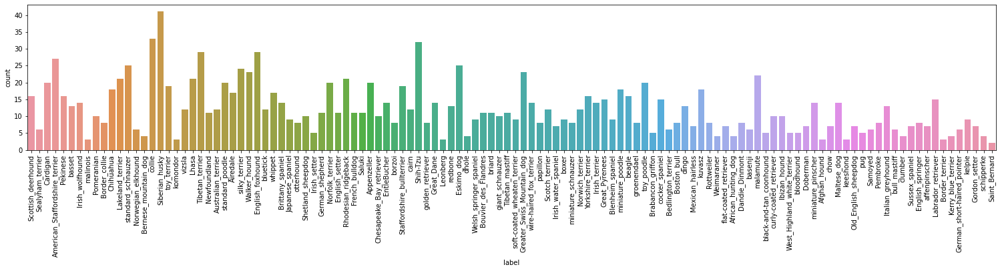

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(26, 4))
plt.xticks(rotation=90)

wrong_result_df = test_df[test_df['gt_class'] != test_df['xception_prediction_class']]

sns.countplot(data=wrong_result_df, x='label')

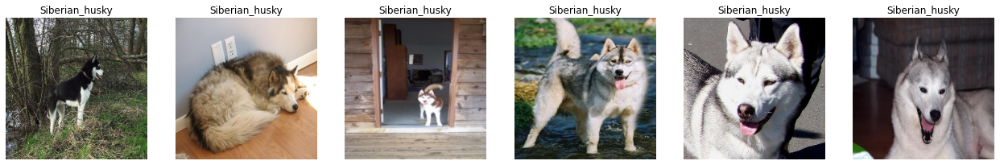

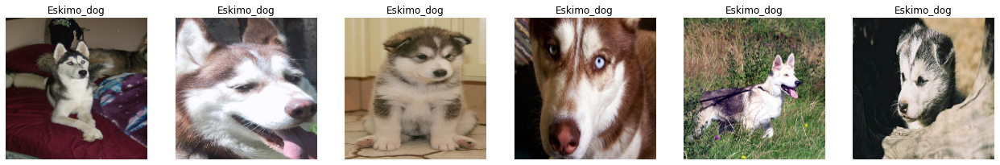

In [64]:
def show_grid_images(image_path_list, augmentor=None, ncols=4, title=None):
    figure, axs = plt.subplots(figsize=(22, 4), nrows=1, ncols=ncols)
    for i in range(ncols):
        image = cv2.cvtColor(cv2.imread(image_path_list[i]), cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (224, 224))
        if augmentor is not None:
            image = augmentor(image=image)['image']
        axs[i].imshow(image)
        axs[i].axis('off')
        axs[i].set_title(title)

breed_image_list_01 = data_df[data_df['label']=='Siberian_husky']['path'].iloc[:6].tolist()
breed_image_list_02 = data_df[data_df['label']=='Eskimo_dog']['path'].iloc[:6].tolist()

show_grid_images(breed_image_list_01, ncols=6, title='Siberian_husky')
show_grid_images(breed_image_list_02, ncols=6, title='Eskimo_dog')